In [ ]:
import os                # Operating system module for interacting with the OS
import glob              # Module for pathname pattern matching

from pathlib import Path  # Path module for path-related operations
from tqdm import tqdm     # Module for creating progress bars
import random             # Module for generating random numbers

import numpy as np                   # Numerical computation library
import matplotlib.pyplot as plt      # Plotting library
import matplotlib.image as mpimg     # Image operations library
from PIL import Image                # Image processing library
from skimage.color import rgb2lab, lab2rgb  # Color space conversion functions

import torch                          # Deep learning library
from torch import nn, optim          # Neural network and optimization functions
from torchvision import transforms   # Data transformation functions
from torchvision.transforms import InterpolationMode  # Image interpolation methods
from torchvision.utils import make_grid  # Function for creating grid of images
from torch.utils.data import Dataset, DataLoader  # Classes for creating custom datasets and data loaders


In [ ]:
pip install torchinfo

## Visualizing the dataset

The code below extracts image paths from a pre-existing text file containing the comprehensive collection of images in the Kaggle database of ImageNet. By efficiently reading and processing each line, it populates a list with the extracted paths. This enables streamlined access and utilization of the image paths for subsequent data handling tasks.

In [ ]:
file_paths = []  # Create an empty list to store file paths

# Open the file containing the list of file paths in read mode
with open('/kaggle/input/trainedgan/file_list.txt', 'r') as f:
    for line in f:
        file_paths.append(line.strip())  # Append each line (file path) to the list after removing leading and trailing whitespace

print(len(file_paths))  # Print the number of file paths in the list

# Retrieve the file paths from a file and store them in a list.
# The file is opened in read mode using the 'with' statement to ensure proper file handling.
# For each line in the file, the leading and trailing whitespace is stripped using the strip() method.
# The stripped file paths are then added to the 'file_paths' list using the append() method.
# Finally, the total number of file paths in the list is printed for reference and verification.


1281167


Every time the 'show_images' function is run, it plots a grid of 20 different images randomly selected from the provided dataset. This allows for a diverse set of images to be displayed with each run, making it useful for exploring the dataset and identifying any potential issues or anomalies.

In [ ]:
def show_images(dataset):
    """
    Display a grid of images from the given dataset.

    Parameters:
        dataset (list): List of image file paths or image objects.

    Returns:
        None
    """
    # Parameters for our graph; we'll output images in a 5x4 configuration
    nrows = 5
    ncols = 4

    fig = plt.gcf()  # Get the current figure
    fig.set_size_inches(ncols * 5, nrows * 5)  # Set the size of the figure

    for i in range(20):
        # Set up subplot; subplot indices start at 1
        # img = mpimg.imread(os.path.join(dataset,random.choice(os.listdir(dataset))))
        img = mpimg.imread(random.choice(dataset))  # Read and load a random image from the dataset

        sp = plt.subplot(nrows, ncols, i + 1)  # Create a subplot
        sp.axis('Off')  # Don't show axes (or gridlines)
        plt.imshow(img)  # Display the image

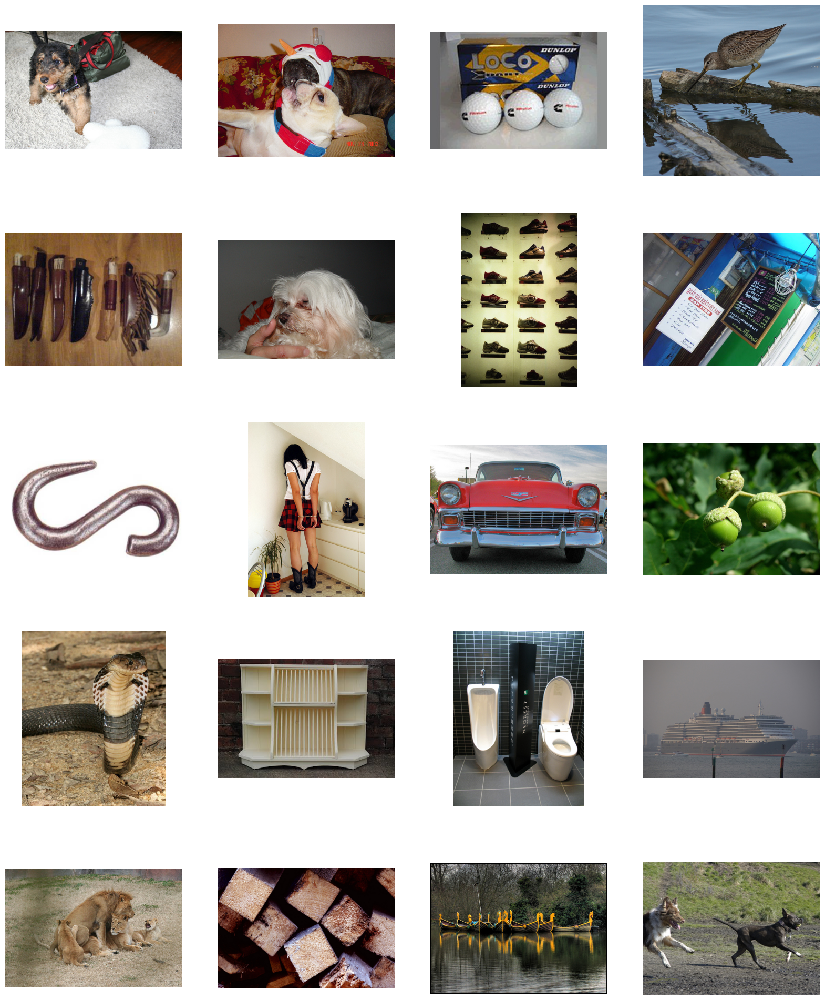

In [ ]:
show_images(file_paths)

# Data Transformation and Normalization Pipeline for Image Processing

In [ ]:
SIZE = 256  # Size of the image to be transformed to.

class ColorizationDataset(Dataset):
    def __init__(self, paths, split='train'):
        """
        Dataset class for colorization.

        Parameters:
            paths (list): List of image file paths.
            split (str): Dataset split ('train' or 'val').

        Returns:
            None
        """
        if split == 'train':
            self.transforms = transforms.Compose([
                transforms.Resize((SIZE, SIZE), InterpolationMode.BICUBIC),  # Resize image to (SIZE, SIZE) using bicubic interpolation
                transforms.RandomHorizontalFlip()  # Apply random horizontal flip for data augmentation (mirroring)
            ])
        elif split == 'val':
            self.transforms = transforms.Resize((SIZE, SIZE), InterpolationMode.BICUBIC)  # Resize image to (SIZE, SIZE) using bicubic interpolation

        self.split = split
        self.size = SIZE
        self.paths = paths

    def __getitem__(self, idx):
        """
        Retrieves and processes an image from the dataset.

        Parameters:
            idx (int): Index of the image to retrieve.

        Returns:
            dict: Dictionary containing the 'L' channel and 'ab' channels of the image.
        """
        img = Image.open(self.paths[idx]).convert("RGB")  # Open the image file and convert to RGB
        img = self.transforms(img)  # Apply image transformations
        img = np.array(img)  # Convert image to a NumPy array
        img_lab = rgb2lab(img).astype("float32")  # Convert RGB image to L*a*b color space
        img_lab = transforms.ToTensor()(img_lab)  # Convert L*a*b image to PyTorch tensor
        L = img_lab[[0], ...] / 50. - 1.  # Normalize L channel to the range [-1, 1]
        ab = img_lab[[1, 2], ...] / 128.  # Normalize ab channels to the range [-1, 1]

        return {'L': L, 'ab': ab}

    def __len__(self):
        """
        Returns the length of the dataset.

        Returns:
            int: Length of the dataset.
        """
        return len(self.paths)

def make_dataloaders(batch_size=4, n_workers=2, pin_memory=True, **kwargs):
    """
    Creates dataloaders for the colorization dataset.

    Parameters:
        batch_size (int): Batch size for the dataloaders.
        n_workers (int): Number of worker processes for data loading.
        pin_memory (bool): If True, enables pinned memory for faster data transfer.
        **kwargs: Additional arguments to be passed to the ColorizationDataset constructor.

    Returns:
        DataLoader: Training dataloader.
    """
    dataset = ColorizationDataset(**kwargs)  # Create the dataset
    dataloader = DataLoader(dataset, batch_size=batch_size, num_workers=n_workers,
                            pin_memory=pin_memory, shuffle=True)  # Create the dataloader

    return dataloader


In [ ]:
train_gan = make_dataloaders(paths=file_paths, split='train')

data = next(iter(train_gan))
Ls, abs_ = data['L'], data['ab']

print('Shape of the Lightness channel:', Ls.shape)
print('Shape of the chromaticity channels:', abs_.shape)
print(len(train_gan))

# Create a training dataloader using the make_dataloaders function
# The dataloader is configured with the file_paths as the dataset paths and split set to 'train'

# Retrieve a batch of data from the dataloader using next(iter(train_gan))
# The batch contains the 'L' channel and 'ab' channels of the images

# Assign the 'L' channel to Ls and the 'ab' channels to abs_

# Print the shape of the 'L' channel (Ls) and the shape of the 'ab' channels (abs_)
# This provides information about the dimensions of the tensors in the batch

# Print the length of the train_gan dataloader
# This indicates the number of batches in the dataloader, which corresponds to the number of iterations for training


Shape of the Lightness channel: torch.Size([4, 1, 256, 256]) 
Shape of the chromaticity channels: torch.Size([4, 2, 256, 256])
320292


In [ ]:
def show_batch(dl):
    """
    Displays a batch of images in the Lab color space.

    Args:
        dl (torch.utils.data.DataLoader): DataLoader object containing the images.
    """
    # Iterate over batches in the DataLoader
    for batch in dl:
        # Extract the L (luminance) and ab (color) channels from the batch
        L, ab = batch['L'], batch['ab']

        # Undo the normalization of the L channel
        L = (L + 1.) * 50.

        # Undo the normalization of the ab channel
        ab = ab * 128.

        # Concatenate the L and ab channels along the channel dimension
        imgs = torch.cat([L, ab], dim=1)

        # Create a new figure and axes for plotting
        fig, ax = plt.subplots(figsize=(30, 30))

        # Remove the ticks on the x and y axes
        ax.set_xticks([]);ax.set_yticks([])

        # Display the image grid by converting it to the RGB color space
        ax.imshow(make_grid(imgs, nrow=16).permute(1, 2, 0))

        # Exit the loop after processing the first batch
        break


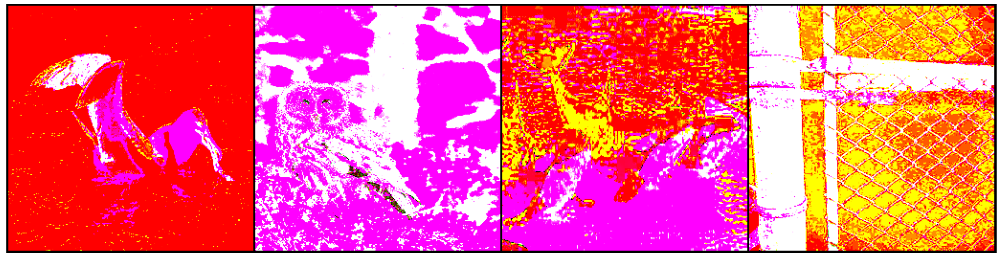

In [ ]:
show_batch(train_gan)

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
device = get_default_device()
device

device(type='cuda')

# Generator

In [ ]:
class Block(nn.Module):
    def __init__(self, in_channels, out_channels, down=True, act="relu"):
        """
        Block module for the generator network.

        Args:
            in_channels (int): Number of input channels.
            out_channels (int): Number of output channels.
            down (bool): Flag indicating whether downsampling should be applied.
            act (str): Activation function to use ("relu" or "leaky").
        """
        super(Block, self).__init__()
        # Define convolutional layers with optional downsampling or upsampling
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 4, 2, 1, bias=False) if down
            else nn.ConvTranspose2d(in_channels, out_channels, 4, 2, 1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU() if act == "relu" else nn.LeakyReLU(0.2)
        )
        self.down = down

    def forward(self, x):
        """
        Forward pass of the block module.

        Args:
            x (torch.Tensor): Input tensor.

        Returns:
            torch.Tensor: Output tensor.
        """
        x = self.conv(x)
        return x


class Generator(nn.Module):
    def __init__(self, in_channels=1, features=64):
        """
        Generator network for image-to-image translation.

        Args:
            in_channels (int): Number of input channels (default: 1).
            features (int): Number of features in the network (default: 64).
        """
        super().__init__()
        # Initial downsampling layer
        self.initial_down = nn.Sequential(
            nn.Conv2d(in_channels, features, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2),
        )

        # Residual blocks
        self.res1 = nn.Sequential(
            nn.Conv2d(features, features, 3, 1, 1, bias=False),
            nn.BatchNorm2d(features),
            nn.LeakyReLU(0.2),
            nn.Conv2d(features, features, 3, 1, 1, bias=False),
            nn.BatchNorm2d(features)
        )

        self.res2 = nn.Sequential(
            nn.Conv2d(features, features, 3, 1, 1, bias=False),
            nn.BatchNorm2d(features),
            nn.LeakyReLU(0.2),
            nn.Conv2d(features, features, 3, 1, 1, bias=False),
            nn.BatchNorm2d(features)
        )

        # Downsample 1
        self.res3 = nn.Sequential(
            Block(features, features * 2, down=True, act="leaky"),
            nn.Conv2d(features * 2, features * 2, 3, 1, 1, bias=False),
            nn.BatchNorm2d(features * 2)
        )
        self.downsample1 = nn.Sequential(
            nn.Conv2d(features, features * 2, 1, 2, bias=False),
            nn.BatchNorm2d(features * 2)
        )

        # Residual block
        self.res4 = nn.Sequential(
            nn.Conv2d(features * 2, features * 2, 3, 1, 1, bias=False),
            nn.BatchNorm2d(features * 2),
            nn.LeakyReLU(0.2),
            nn.Conv2d(features * 2, features * 2, 3, 1, 1, bias=False),
            nn.BatchNorm2d(features * 2)
        )

        # Downsample 2
        self.down2 = nn.Sequential(
            Block(features * 2, features * 4, down=True, act="leaky"),
            nn.Conv2d(features * 4, features * 4, 3, 1, 1, bias=False),
            nn.BatchNorm2d(features * 4)
        )
        self.downsample2 = nn.Sequential(
            nn.Conv2d(features * 2, features * 4, 1, 2, bias=False),
            nn.BatchNorm2d(features * 4)
        )

        # Residual block
        self.res5 = nn.Sequential(
            nn.Conv2d(features * 4, features * 4, 3, 1, 1, bias=False),
            nn.BatchNorm2d(features * 4),
            nn.LeakyReLU(0.2),
            nn.Conv2d(features * 4, features * 4, 3, 1, 1, bias=False),
            nn.BatchNorm2d(features * 4)
        )

        # Downsample 3
        self.downsample3 = nn.Sequential(
            nn.Conv2d(features * 8, features * 8, 1, 2, bias=False),
            nn.BatchNorm2d(features * 8)
        )
        self.down3 = Block(features * 4, features * 8, down=True, act="leaky")

        # Downsample 4
        self.downsample4 = nn.Sequential(
            nn.Conv2d(features * 8, features * 8, 1, 2, bias=False),
            nn.BatchNorm2d(features * 8)
        )
        self.down4 = Block(features * 8, features * 8, down=True, act="leaky")

        # Downsample 5
        self.downsample5 = nn.Sequential(
            nn.Conv2d(features * 4, features * 8, 1, 2, bias=False),
            nn.BatchNorm2d(features * 8)
        )

        self.down5 = Block(features * 8, features * 8, down=True, act="leaky")
        self.down6 = Block(features * 8, features * 8, down=True, act="leaky")

        # Bottleneck
        self.bottleneck = nn.Sequential(
            nn.Conv2d(features * 8, features * 8, 4, 2, 1),
            nn.ReLU()
        )

        # Upsampling blocks
        self.up1 = Block(features * 8, features * 8, down=False, act="relu")
        self.up2 = nn.Sequential(
            Block(features * 8 * 2, features * 8, down=False, act="relu"),
            nn.Dropout(0.5)
        )
        self.up3 = nn.Sequential(
            Block(features * 8 * 2, features * 8, down=False, act="relu"),
            nn.Dropout(0.5)
        )
        self.up4 = nn.Sequential(
            Block(features * 8 * 2, features * 8, down=False, act="relu"),
            nn.Dropout(0.5)
        )
        self.up5 = Block(features * 8 * 2, features * 4, down=False, act="relu")
        self.up6 = Block(features * 4 * 2, features * 2, down=False, act="relu")
        self.up7 = Block(features * 2 * 2, features, down=False, act="relu")

        # Final output layer
        self.final_up = nn.Sequential(
            nn.ConvTranspose2d(features * 2, 2, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )

    def forward(self, x):
        """
        Forward pass of the generator network.

        Args:
            x (torch.Tensor): Input tensor.

        Returns:
            torch.Tensor: Output tensor.
        """
        # Downsampling
        d1 = self.initial_down(x)
        d2 = self.res1(d1)
        d3 = self.res2(d2) + d1
        d4 = self.res3(d3) + self.downsample1(d3)  #downsample
        d5 = self.res4(d4) + d4  #downsample
        d6 = self.down2(d5) + self.downsample2(d5)
        d7 = self.res5(d6) + d6
        d8 = self.down3(d7) + self.downsample5(d7)
        d9 = self.down4(d8) + self.downsample3(d8)
        d10 = self.down5(d9)
        d11 = self.down6(d10) + self.downsample4(d10)
        # Bottleneck
        bottleneck = self.bottleneck(d11)
        # Upsampling blocks
        up1 = self.up1(bottleneck)
        up2 = self.up2(torch.cat([up1, d11], 1))
        up3 = self.up3(torch.cat([up2, d10], 1))
        up4 = self.up4(torch.cat([up3, d9], 1))
        up5 = self.up5(torch.cat([up4, d8], 1))
        up6 = self.up6(torch.cat([up5, d7], 1))
        up7 = self.up7(torch.cat([up6, d5], 1))
        # Final output
        return self.final_up(torch.cat([up7, d3], 1))

In [ ]:
model = Generator(features=64)
model

Generator(
  (initial_down): Sequential(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2)
  )
  (res1): Sequential(
    (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (res2): Sequential(
    (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.2)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)


In [ ]:
from torchinfo import summary
summary(Generator(features=64), input_size=(4, 1, 256, 256))

Layer (type:depth-idx)                        Output Shape              Param #
Generator                                     [4, 2, 256, 256]          --
├─Sequential: 1-1                             [4, 64, 128, 128]         --
│    └─Conv2d: 2-1                            [4, 64, 128, 128]         1,024
│    └─LeakyReLU: 2-2                         [4, 64, 128, 128]         --
├─Sequential: 1-2                             [4, 64, 128, 128]         --
│    └─Conv2d: 2-3                            [4, 64, 128, 128]         36,864
│    └─BatchNorm2d: 2-4                       [4, 64, 128, 128]         128
│    └─LeakyReLU: 2-5                         [4, 64, 128, 128]         --
│    └─Conv2d: 2-6                            [4, 64, 128, 128]         36,864
│    └─BatchNorm2d: 2-7                       [4, 64, 128, 128]         128
├─Sequential: 1-3                             [4, 64, 128, 128]         --
│    └─Conv2d: 2-8                            [4, 64, 128, 128]         36,864
│  

# Discriminator

In [ ]:
class PatchDiscriminator(nn.Module):
    def __init__(self, input_c, num_filters=64, n_down=3):
        """
        Patch discriminator network for image classification.

        Args:
            input_c (int): Number of input channels.
            num_filters (int): Number of base filters.
            n_down (int): Number of downsampling layers.
        """
        super().__init__()

        model = [self.get_layers(input_c, num_filters, norm=False)]

        # Downsampling layers
        for i in range(n_down):
            stride = 1 if i == (n_down - 1) else 2
            model += [self.get_layers(num_filters * 2 ** i, num_filters * 2 ** (i + 1), s=stride)]

        # Last layer
        model += [self.get_layers(num_filters * 2 ** n_down, 1, s=1, norm=False, act=False)] # Make sure to not use normalization or
                                                                                        # activation for the last layer of the model

        self.model = nn.Sequential(*model)

    def get_layers(self, ni, nf, k=4, s=2, p=1, norm=True, act=True):
        """
        Create a sequence of layers for a block.

        Args:
            ni (int): Number of input channels.
            nf (int): Number of output channels.
            k (int): Kernel size.
            s (int): Stride.
            p (int): Padding.
            norm (bool): Whether to use batch normalization.
            act (bool): Whether to use activation (LeakyReLU).

        Returns:
            nn.Sequential: Sequential module containing the layers.
        """
        layers = [nn.Conv2d(ni, nf, k, s, p, bias=not norm)]

        if norm:
            layers += [nn.BatchNorm2d(nf)]
        if act:
            layers += [nn.LeakyReLU(0.2, True)]

        return nn.Sequential(*layers)

    def forward(self, x):
        """
        Forward pass of the patch discriminator network.

        Args:
            x (torch.Tensor): Input tensor.

        Returns:
            torch.Tensor: Output tensor.
        """
        return self.model(x)


In [ ]:
PatchDiscriminator(input_c=3,n_down=3)

PatchDiscriminator(
  (model): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (2): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (3): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2, inplace=True)
    )
    (

In [ ]:
summary(PatchDiscriminator(input_c=3,n_down=3), input_size=(4, 3, 256, 256))

Layer (type:depth-idx)                   Output Shape              Param #
PatchDiscriminator                       [4, 1, 30, 30]            --
├─Sequential: 1-1                        [4, 1, 30, 30]            --
│    └─Sequential: 2-1                   [4, 64, 128, 128]         --
│    │    └─Conv2d: 3-1                  [4, 64, 128, 128]         3,136
│    │    └─LeakyReLU: 3-2               [4, 64, 128, 128]         --
│    └─Sequential: 2-2                   [4, 128, 64, 64]          --
│    │    └─Conv2d: 3-3                  [4, 128, 64, 64]          131,072
│    │    └─BatchNorm2d: 3-4             [4, 128, 64, 64]          256
│    │    └─LeakyReLU: 3-5               [4, 128, 64, 64]          --
│    └─Sequential: 2-3                   [4, 256, 32, 32]          --
│    │    └─Conv2d: 3-6                  [4, 256, 32, 32]          524,288
│    │    └─BatchNorm2d: 3-7             [4, 256, 32, 32]          512
│    │    └─LeakyReLU: 3-8               [4, 256, 32, 32]          --


# Model weight Initialization

In [ ]:
def init_weights(net, init='norm', gain=0.02):
    """
    Initialize the weights of a network.

    Args:
        net (nn.Module): The network to initialize.
        init (str): The type of weight initialization method. Options are 'norm', 'xavier', or 'kaiming'.
        gain (float): The std value to be used in weight initialization.

    Returns:
        nn.Module: The initialized network.
    """
    def init_func(m):
        classname = m.__class__.__name__

        if hasattr(m, 'weight') and 'Conv' in classname:
            if init == 'norm':
                nn.init.normal_(m.weight.data, mean=0.0, std=gain)
            elif init == 'xavier':
                nn.init.xavier_normal_(m.weight.data, gain=gain)
            elif init == 'kaiming':
                nn.init.kaiming_normal_(m.weight.data, a=0, mode='fan_in')

            if hasattr(m, 'bias') and m.bias is not None:
                nn.init.constant_(m.bias.data, 0.0)

        elif 'BatchNorm2d' in classname:
            nn.init.normal_(m.weight.data, 1., gain)
            nn.init.constant_(m.bias.data, 0.)

    net.apply(init_func)
    print(f"Model initialized with {init} initialization")
    return net

def init_model(model, device):
    """
    Initialize a model and move it to a specified device.

    Args:
        model (nn.Module): The model to initialize.
        device (torch.device): The device to move the model to.

    Returns:
        nn.Module: The initialized and moved model.
    """
    model = model.to(device)
    model = init_weights(model)
    return model


# Loss Function

In [ ]:
class GANLoss(nn.Module):
    def __init__(self, real_label=1.0, fake_label=0.0):
        """
        GAN loss function for adversarial training.

        Args:
            real_label (float): The label value to use for real samples.
            fake_label (float): The label value to use for fake/generated samples.
        """
        super().__init__()
        self.register_buffer('real_label', torch.tensor(real_label))
        self.register_buffer('fake_label', torch.tensor(fake_label))
        self.loss = nn.BCEWithLogitsLoss()

    def get_labels(self, preds, target_is_real):
        """
        Get the target labels based on whether the target is real or fake.

        Args:
            preds (torch.Tensor): The predicted values from the discriminator.
            target_is_real (bool): Whether the target is real or fake.

        Returns:
            torch.Tensor: The target labels expanded to match the shape of the predictions.
        """
        if target_is_real:
            labels = self.real_label
        else:
            labels = self.fake_label
        return labels.expand_as(preds)

    def __call__(self, preds, target_is_real):
        """
        Compute the GAN loss.

        Args:
            preds (torch.Tensor): The predicted values from the discriminator.
            target_is_real (bool): Whether the target is real or fake.

        Returns:
            torch.Tensor: The computed GAN loss.
        """
        labels = self.get_labels(preds, target_is_real)
        loss = self.loss(preds, labels)
        return loss

# GAN Training

In [ ]:
class MainModel(nn.Module):
    def __init__(self, net_G=None, net_D=None, lr_G=2e-4, lr_D=2e-4, beta1=0.5, beta2=0.999, lambda_L1=100.):
        """
        Main model for image colorization using a generator (net_G) and discriminator (net_D).

        Args:
            net_G (nn.Module, optional): Generator network. If not provided, a new Unet will be created and used.
            net_D (nn.Module, optional): Discriminator network. If not provided, a new PatchDiscriminator will be created and used.
            lr_G (float, optional): Learning rate for the generator optimizer. Default is 2e-4.
            lr_D (float, optional): Learning rate for the discriminator optimizer. Default is 2e-4.
            beta1 (float, optional): Beta1 value for Adam optimizer. Default is 0.5.
            beta2 (float, optional): Beta2 value for Adam optimizer. Default is 0.999.
            lambda_L1 (float, optional): Weight for L1 loss in the generator loss function. Default is 100.0.
        """
        super().__init__()
        # Set the device based on the availability of CUDA
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.lambda_L1 = lambda_L1

        if net_G is None:
            self.net_G = to_device(init_model(Generator(features=64)), device)  # Initialize the generator network
        else:
            self.net_G = to_device(net_G, device)

        if net_D is None:
            self.net_D = to_device(init_model(PatchDiscriminator(input_c=3,     # Initialize the discriminator network
                                    n_down=3, num_filters=64), device), device)
        else:
            self.net_D = to_device(net_D, device)

        # Initialize loss functions and optimizers
        self.GANcriterion = GANLoss().to(self.device)
        self.L1criterion = nn.L1Loss().to(self.device)
        self.opt_G = optim.Adam(self.net_G.parameters(), lr=lr_G, betas=(beta1, beta2))
        self.opt_D = optim.Adam(self.net_D.parameters(), lr=lr_D, betas=(beta1, beta2))

    def set_requires_grad(self, model, requires_grad=True):
        """
        Set the `requires_grad` attribute of model parameters.

        Args:
            model (nn.Module): The model for which to set the `requires_grad` attribute.
            requires_grad (bool, optional): Whether the model parameters require gradients. Default is True.
        """
        # This function can be used to freeze or unfreeze the model during training
        for p in model.parameters():
            p.requires_grad = requires_grad

    def setup_input(self, data):
        """
        Set up the input data for the model.

        Args:
            data (dict): A dictionary containing the input data.
        """
        self.L = to_device(data['L'], device)
        self.ab = to_device(data['ab'], device)

    def forward(self):
        """
        Forward pass of the model.
        """
        self.fake_color = self.net_G(self.L)

    def backward_D(self):
        """
        Backward pass for the discriminator.
        """
        fake_image = torch.cat([self.L, self.fake_color], dim=1)    # Concatenate L and fake_color along the channel dimension
        fake_preds = self.net_D(fake_image.detach())                # Pass the concatenated image through the discriminator network with detached gradients
        self.loss_D_fake = self.GANcriterion(fake_preds, False)     # Compute the GAN loss for the fake predictions
        real_image = torch.cat([self.L, self.ab], dim=1)            # Concatenate L and ab along the channel dimension
        real_preds = self.net_D(real_image)                         # Pass the real image through the discriminator network
        self.loss_D_real = self.GANcriterion(real_preds, True)      # Compute the GAN loss for the real predictions
        self.loss_D = (self.loss_D_fake + self.loss_D_real) * 0.5   # Combine the fake and real GAN losses
        self.loss_D.backward()                                      # Perform backward pass and compute gradients

    def backward_G(self):
        """
        Backward pass for the generator.
        """
        fake_image = torch.cat([self.L, self.fake_color], dim=1)    # Concatenate L and fake_color along the channel dimension
        fake_preds = self.net_D(fake_image)                         # Pass the concatenated image through the discriminator network
        self.loss_G_GAN = self.GANcriterion(fake_preds, True)       # Compute the GAN loss for the generator
        self.loss_G_L1 = self.L1criterion(self.fake_color,          # Compute the L1 loss between fake_color and ab and scale it by lambda_L1
                                          self.ab)* self.lambda_L1
        self.loss_G = self.loss_G_GAN + self.loss_G_L1              # Combine the GAN and L1 losses
        self.loss_G.backward()                                      # Perform backward pass and compute gradients

    def optimize(self):
        """
        Optimize the model by performing forward and backward passes, and updating the generator and discriminator.
        """
        self.forward()                                  # Perform forward pass through the generator

        self.net_D.train()                              # Set discriminator to training mode and enable gradients
        self.set_requires_grad(self.net_D, True)
        self.opt_D.zero_grad()                          # Zero the gradients of discriminator optimizer
        self.backward_D()                               # Perform backward pass for discriminator
        self.opt_D.step()                               # Update discriminator weights

        self.net_G.train()                              # Set generator to training mode and disable gradients for discriminator
        self.set_requires_grad(self.net_D, False)
        self.opt_G.zero_grad()                          # Zero the gradients of generator optimizer
        self.backward_G()                               # Perform backward pass for generator
        self.opt_G.step()                               # Update generator weights


# Printing and visualization

In [ ]:
class AverageMeter:
    """
    Computes and stores the average and sum of values over time.
    """
    def __init__(self):
        self.reset()                   # Initialize the meter by calling the reset method

    def reset(self):
        """
        Resets the meter to its initial state.
        """
        self.count, self.avg, self.sum = [0.] * 3        # Set count, average, and sum to 0

    def update(self, val, count=1):
        """
        Updates the meter with a new value.

        Args:
            val (float): The new value to be added.
            count (int): The count associated with the new value (default: 1).
        """
        self.count += count         # Increment the count by the specified value (default is 1)
        self.sum += count * val     # Add the product of count and value to the sum
        self.avg = self.sum / self.count       # Calculate the average by dividing the sum by the count

def create_loss_meters():
    """
    Creates and returns a dictionary of AverageMeter objects for tracking loss values.

    Returns:
    A dictionary containing AverageMeter objects for various loss values.

    Example usage:
    loss_meters = create_loss_meters()
    loss_meters['loss_D_fake'].update(0.5)
    print(loss_meters['loss_D_fake'].avg)
    """
    # Create AverageMeter objects for tracking loss values
    loss_D_fake = AverageMeter()  # Meter for tracking the fake discriminator loss
    loss_D_real = AverageMeter()  # Meter for tracking the real discriminator loss
    loss_D = AverageMeter()  # Meter for tracking the overall discriminator loss
    loss_G_GAN = AverageMeter()  # Meter for tracking the GAN (generator adversarial) loss
    loss_G_L1 = AverageMeter()  # Meter for tracking the L1 loss (e.g., reconstruction loss) for the generator
    loss_G = AverageMeter()  # Meter for tracking the overall generator loss

    # Creates and returns a dictionary of the AverageMeter objects
    return {'loss_D_fake': loss_D_fake,
            'loss_D_real': loss_D_real,
            'loss_D': loss_D,
            'loss_G_GAN': loss_G_GAN,
            'loss_G_L1': loss_G_L1,
            'loss_G': loss_G}

def update_losses(model, loss_meter_dict, count):
    """
    Updates the loss meters with the losses from the model.

    Args:
        model (MainModel): The model containing the losses.
        loss_meter_dict (dict): A dictionary of loss meters.
        count (int): The count associated with the losses.
    """
    # Iterate over each loss name and corresponding loss meter in the dictionary
    for loss_name, loss_meter in loss_meter_dict.items():
        loss = getattr(model, loss_name)                    # Get the loss value from the model using the loss name
        loss_meter.update(loss.item(), count=count)         # Update the loss meter with the loss value and count

def lab_to_rgb(L, ab):
    """
    Converts LAB color space to RGB color space.

    Args:
        L (tensor): L channel of LAB color space.
        ab (tensor): ab channels of LAB color space.

    Returns:
        ndarray: RGB images converted from LAB color space.
    """
    L = (L + 1.) * 50.   # Scale L channel to the range [0, 100]
    ab = ab * 128.       # Scale ab channels to the range [-128, 127]
    Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).cpu().numpy()     # Combine L and ab channels into a single tensor in LAB color space,
                                                                          # Permute dimensions to match the expected format for conversion, and
                                                                          # Convert the LAB color space tensor to a numpy array
    rgb_imgs = []        # Create an empty list to store the RGB images
    for img in Lab:      # Iterate over each image in the batch
        img_rgb = lab2rgb(img)          # Convert the LAB image to RGB color space
        rgb_imgs.append(img_rgb)        # Append the RGB image to the list
    return np.stack(rgb_imgs, axis=0)     # Convert the list of RGB images to a numpy array

def visualize(model, data, path, iteration, save=True):
    """
    Visualizes the model's outputs by converting them to RGB images.

    Args:
        model (MainModel): The model to visualize.
        data (dict): Input data for the model.
        path (str): Path to save the visualization images.
        iteration (int): Current iteration count.
        save (bool): Whether to save the visualization images (default: True).
    """
    model.net_G.eval()                    # Set the generator model to evaluation mode
    with torch.no_grad():                 # Disable gradient calculation and perform inference
        model.setup_input(data)           # Set up the input data for the model
        model.forward()                   # Forward pass through the model
    model.net_G.train()                   # Set the generator model back to training mode

    # Retrieve the generated color and real color from the model
    fake_color = model.fake_color.detach()
    real_color = model.ab
    L = model.L
    # Convert the LAB color images to RGB color space
    fake_imgs = lab_to_rgb(L, fake_color)
    real_imgs = lab_to_rgb(L, real_color)

    fig = plt.figure(figsize=(15, 8))             # Create a figure to display the images

    # Loop over 4 images in the batch
    for i in range(4):
      # Display the L channel image
        ax = plt.subplot(3, 5, i + 1)
        ax.imshow(L[i][0].cpu(), cmap='gray')
        ax.axis("off")
         # Display the generated colorized image
        ax = plt.subplot(3, 5, i + 1 + 5)
        ax.imshow(fake_imgs[i])
        ax.axis("off")
        # Display the real color image
        ax = plt.subplot(3, 5, i + 1 + 10)
        ax.imshow(real_imgs[i])
        ax.axis("off")
    # Show the figure
    plt.show()
    # Save the figure if save flag is True
    if save:
        fig.savefig(path + f"/colorization_{iteration}.png")

def log_results(loss_meter_dict):
    """
    Logs the average losses from the loss meters.

    Args:
        loss_meter_dict (dict): A dictionary of loss meters.
    """
    # Iterate over each loss name and corresponding loss meter in the dictionary
    for loss_name, loss_meter in loss_meter_dict.items():
        print(f"{loss_name}: {loss_meter.avg:.5f}")        # Print the loss name and the average value from the loss meter


#Creating Directories

Creating Directories for saving trained models and images saved during training

In [ ]:
!mkdir /kaggle/working/trained
!mkdir /kaggle/working/images
!mkdir /kaggle/working/ganimages

mkdir: cannot create directory ‘/kaggle/working/trained’: File exists
mkdir: cannot create directory ‘/kaggle/working/images’: File exists
mkdir: cannot create directory ‘/kaggle/working/ganimages’: File exists


# Training

## GAN Training

In [ ]:
def train_model(model, train_dl, epochs, display_every=20000, iteration=1, epc=1):
    """
    Train the model on the training dataset for the specified number of epochs.

    Args:
        model (MainModel): The model to train.
        train_dl (DataLoader): The training data loader.
        epochs (int): The number of epochs to train for.
        display_every (int): Frequency of displaying the losses and saving the model weights (default: 20000).
        iteration (int): Starting iteration count (default: 1).
        epc (int): Current epoch count (default: 1).
    """
    for e in range(epochs):
        # Create loss meter objects to log the losses of the complete network
        loss_meter_dict = create_loss_meters()          # function returing a dictionary of objects to
                                                        # log the losses of the complete network
        # Iterate over the training data loader
        for i, data in tqdm(enumerate(train_dl, 1)):
            # Set up the input data for the model
            model.setup_input(data)

            # Optimize the model
            model.optimize()

            # Update the loss meters with the current batch
            update_losses(model, loss_meter_dict, count=data['L'].size(0))  # function updating the log objects

            if iteration % display_every == 0 or iteration == (320292 * epc):
                print(f"\nEpoch {e+1}/{epochs}")
                print(f"Iteration {i}/{len(train_dl)}")

                # Print out the losses
                log_results(loss_meter_dict)

                # Save the generator and discriminator weights
                torch.save(model.net_G.state_dict(), f'/kaggle/working/trained/G_{e+1}_{iteration}_gan.pth')
                torch.save(model.net_D.state_dict(), f'/kaggle/working/trained/D_{e+1}_{iteration}.pth')

            if iteration % 50000 == 0 or iteration == (320292 * epc):
                # Visualize the model's outputs
                visualize(model, data, '/kaggle/working/ganimages', iteration, save=True)

            iteration += 1

        # Save the generator and discriminator weights at the end of each epoch
        torch.save(model.net_G.state_dict(), f'/kaggle/working/trained/G_{e+1}_{iteration}_gan.pth')
        torch.save(model.net_D.state_dict(), f'/kaggle/working/trained/D_{e+1}_{iteration}.pth')


In [ ]:
# Loading of the Generator for resuming training
G = to_device(Generator(features=64),device)
G.load_state_dict(torch.load('/kaggle/input/trainedgan/G_1_375000_nogan.pth'))

# Loading of the Discriminator for resuming training
D = to_device(PatchDiscriminator(input_c=3, n_down=3, num_filters=64),device)
D.load_state_dict(torch.load('/kaggle/input/trainedgan/D_1_2550000.pth'))

model=to_device(MainModel(net_G=G,net_D=D),device)

24999it [57:26,  7.32it/s]


Epoch 1/1
Iteration 25000/320292
loss_D_fake: 0.51612
loss_D_real: 0.55826
loss_D: 0.53719
loss_G_GAN: 1.18181
loss_G_L1: 7.37953
loss_G: 8.56134


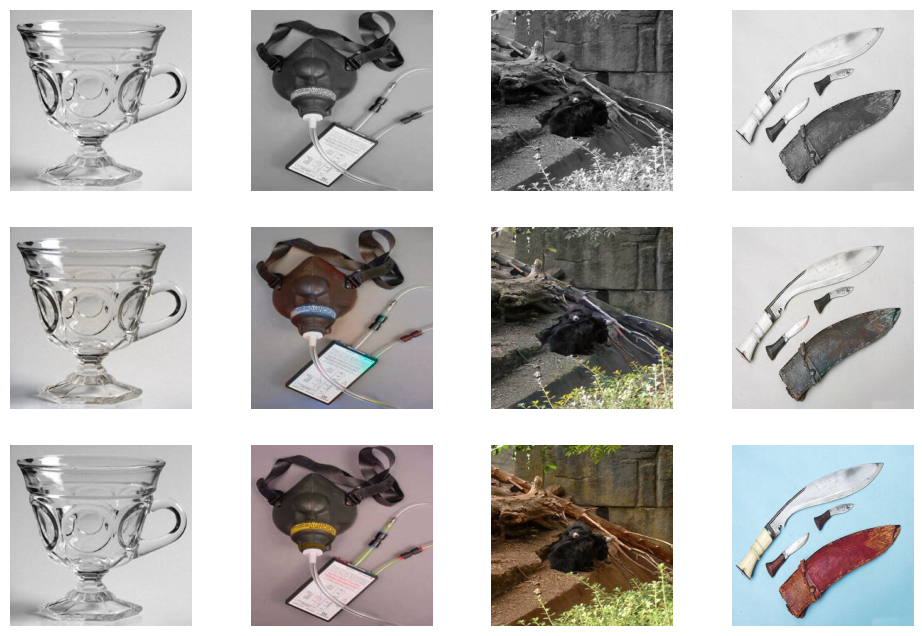

37335it [1:25:08,  7.86it/s]


Epoch 1/1
Iteration 37336/320292
loss_D_fake: 0.51771
loss_D_real: 0.55946
loss_D: 0.53858
loss_G_GAN: 1.17805
loss_G_L1: 7.39149
loss_G: 8.56953


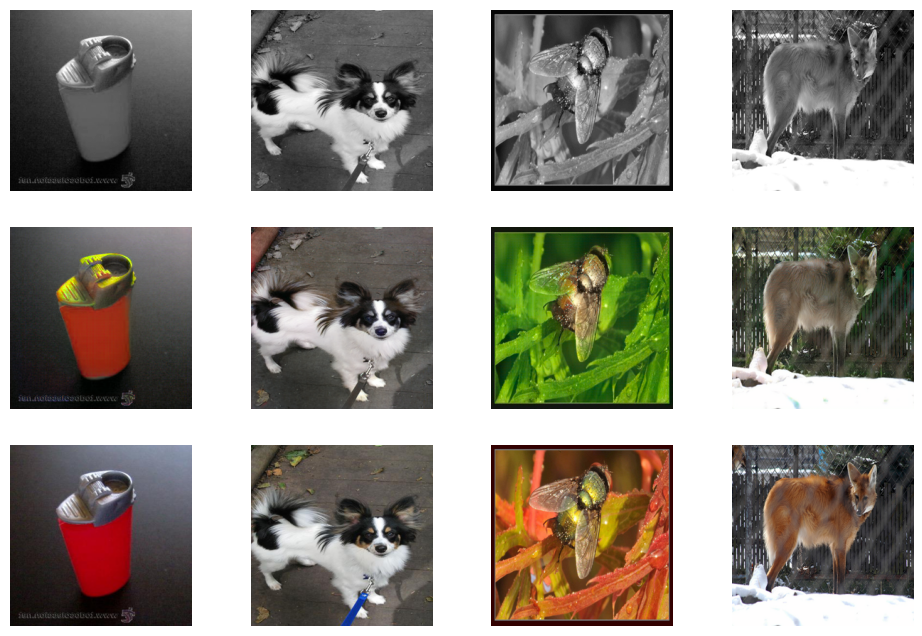

49999it [1:54:43,  8.13it/s]


Epoch 1/1
Iteration 50000/320292
loss_D_fake: 0.51809
loss_D_real: 0.55941
loss_D: 0.53875
loss_G_GAN: 1.17768
loss_G_L1: 7.39426
loss_G: 8.57194


74999it [2:53:27,  7.46it/s]


Epoch 1/1
Iteration 75000/320292
loss_D_fake: 0.51609
loss_D_real: 0.55728
loss_D: 0.53668
loss_G_GAN: 1.18678
loss_G_L1: 7.40572
loss_G: 8.59249


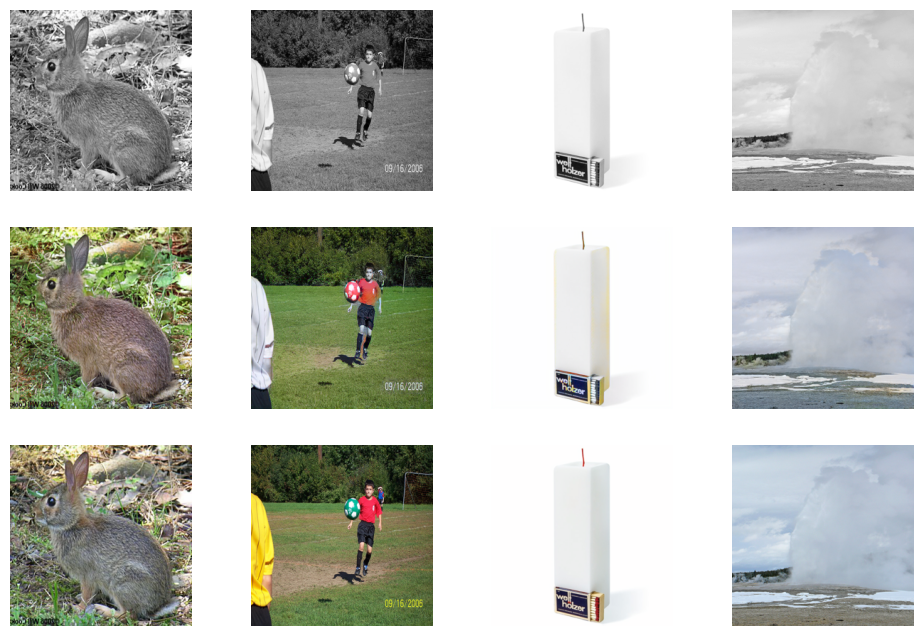

99999it [3:48:09,  7.96it/s]


Epoch 1/1
Iteration 100000/320292
loss_D_fake: 0.51290
loss_D_real: 0.55358
loss_D: 0.53324
loss_G_GAN: 1.20379
loss_G_L1: 7.41164
loss_G: 8.61543


124999it [4:43:11,  8.02it/s]


Epoch 1/1
Iteration 125000/320292
loss_D_fake: 0.50779
loss_D_real: 0.54806
loss_D: 0.52793
loss_G_GAN: 1.23039
loss_G_L1: 7.41770
loss_G: 8.64809


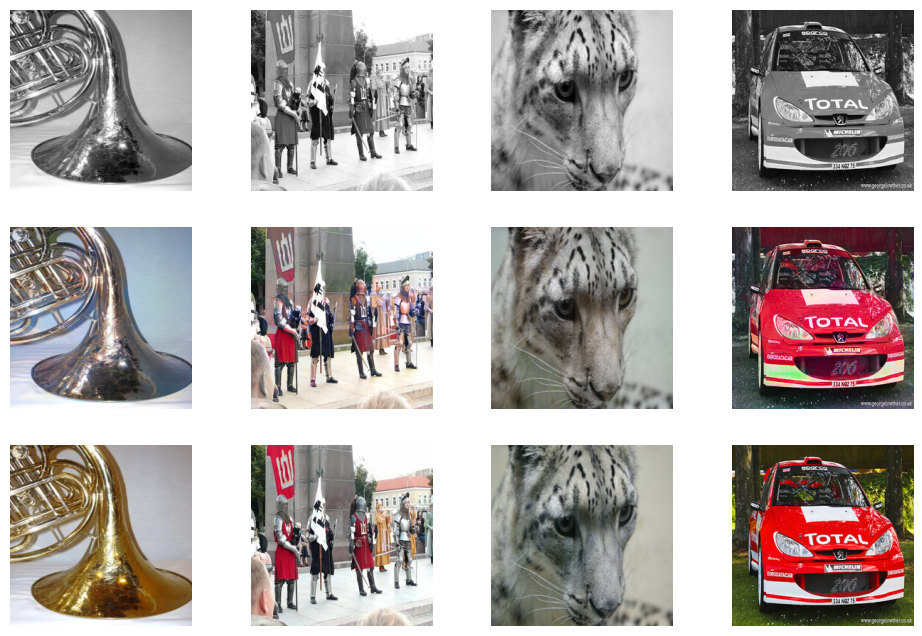

149999it [5:37:35,  7.65it/s]


Epoch 1/1
Iteration 150000/320292
loss_D_fake: 0.50064
loss_D_real: 0.54093
loss_D: 0.52078
loss_G_GAN: 1.26628
loss_G_L1: 7.42273
loss_G: 8.68901


174999it [6:31:41,  8.03it/s]


Epoch 1/1
Iteration 175000/320292
loss_D_fake: 0.49397
loss_D_real: 0.53404
loss_D: 0.51400
loss_G_GAN: 1.30399
loss_G_L1: 7.42922
loss_G: 8.73321


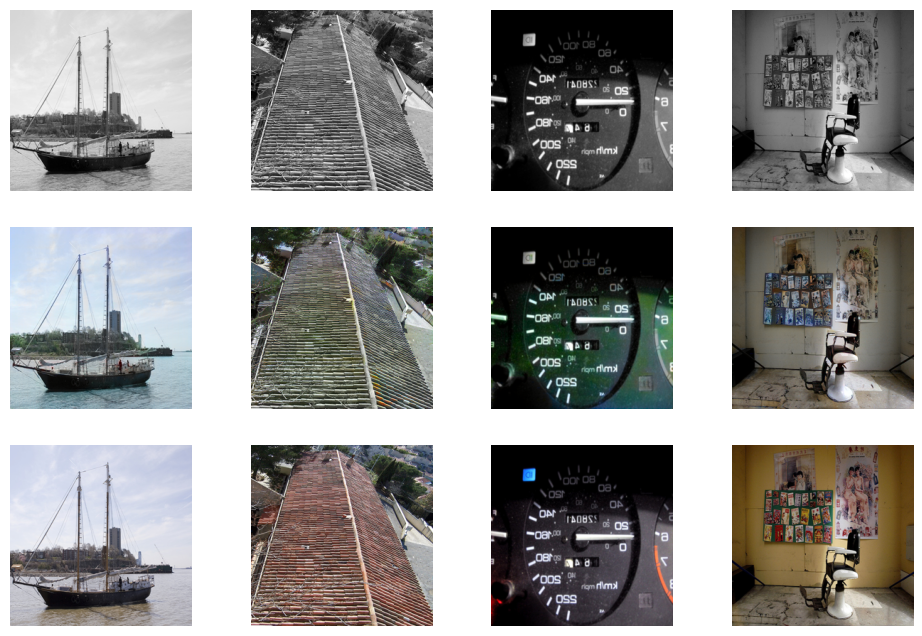

199999it [7:25:26,  7.76it/s]


Epoch 1/1
Iteration 200000/320292
loss_D_fake: 0.48844
loss_D_real: 0.52843
loss_D: 0.50844
loss_G_GAN: 1.33698
loss_G_L1: 7.43512
loss_G: 8.77210


200313it [7:26:10,  7.48it/s]


KeyboardInterrupt: 

In [ ]:
train_model(model, train_gan, 1,display_every=25000,epc=8,iteration=1525001)